<a href="https://colab.research.google.com/github/YoussefKhafaga/Lucas-Kanade-tracking-algorithm/blob/main/Lucas_Kanade_Tracker.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np, cv2 as cv
from google.colab.patches import cv2_imshow
import matplotlib
import matplotlib.pyplot as plt
!pip install ipympl
from google.colab import output
from tqdm import tqdm
import os
output.enable_custom_widget_manager()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
def parse_video(vid_path,is_numpy=True):
  if is_numpy:
    vid=np.load(vid_path)
  for frame in np.moveaxis(vid, -1, 0):
    yield frame

In [ ]:
def onclick(event):
  global coord,x_range,y_range
  if len(coord)>1:
    coord,x_range,y_range=[],[],[]
  ix, iy = int(event.xdata), int(event.ydata)
  coord.append((ix,iy))
  x_range.append(ix)
  y_range.append(iy)
  print(ix, iy)
def selectpt(img):
  fig, ax = plt.subplots(figsize=(15,15))
  ax.imshow(img,cmap='gray')
  cid = fig.canvas.mpl_connect('button_press_event', onclick)

In [ ]:
def get_coordinates_array(x_range,y_range):
    a=(x_range[1]-x_range[0]) + 1
    b=(y_range[1]-y_range[0]) + 1
    coordinates=np.zeros((3,a*b))
    count=0
    for y in range(y_range[0],y_range[1]+1):
        for x in range(x_range[0],x_range[1]+1):
            coordinates[0,count]=x
            coordinates[1,count]=y
            coordinates[2,count]=1
            count+=1            
    return coordinates

def get_new_coord(T_x_coordinates,p,x_range,y_range):
    x1,x2=x_range
    y1,y2=y_range
    vertex_array=np.array([[x1,x1,x2,x2],[y1,y2,y2,y1],[1,1,1,1]])

    affine_mat =np.zeros((2,3))
    count =0
    for i in range(3):
        for j in range(2):
            affine_mat[j,i]= p[count,0] 
            count =count+1 
    affine_mat[0,0]+=1
    affine_mat[1,1]+=1
    new_vertex_array=np.dot(affine_mat,vertex_array)
    new_coordinates=np.dot(affine_mat,T_x_coordinates)
    new_coordinates = new_coordinates.astype(int)
    return new_coordinates,new_vertex_array

def get_pixel_array(image,coordinates):
    img_array = np.zeros((1,coordinates.shape[1]))
    img_array[0,:]=image[coordinates[1,:],coordinates[0,:]]  
    return img_array

def compute_error(img_array1,img_array2):
    error=img_array1-img_array2
    return error   

def get_T_x_array(Template_image, x_range, y_range):
    T_x_coordinates=get_coordinates_array(x_range,y_range)
    p_T_x=np.array([[0,0,0,0,0,0]]).T
    new_coordinates,new_ver=get_new_coord(T_x_coordinates,p_T_x,x_range,y_range)
    T_x_img_arr = get_pixel_array(Template_image,new_coordinates)
    return T_x_img_arr

def convert_lab(image):
   clahe = cv.createCLAHE(clipLimit=1., tileGridSize=(1,1))
   lab = cv.cvtColor(image, cv.COLOR_BGR2LAB)
   l, a, b = cv.split(lab)  
   l2 = clahe.apply(b)  
   lab = cv.merge((l,a,l2))  
   img2 = cv.cvtColor(lab, cv.COLOR_LAB2BGR)
   return img2
    
def array_to_img(arrayimage,x_range,y_range):
    a=(x_range[1]-x_range[0]) + 1
    b=(y_range[1]-y_range[0]) + 1
    img=arrayimage.astype(np.uint8)
    image=np.reshape(img,(b,a))
    return image 

def sobel(img): 
    sobelx = cv.Sobel(img,cv.CV_64F,1,0,ksize=3)   
    sobely = cv.Sobel(img,cv.CV_64F,0,1,ksize=3)
    return sobelx,sobely

def jacobian(x,y):
    mat=np.array(([x,0,y,0,1,0],[0,x,0,y,0,1]))  
    return mat

def get_delta_p(err_array,steep_descent):
    SDParam = np.dot(steep_descent.T, err_array.T)
    Hessian = np.dot(steep_descent.T, steep_descent)
    Hessian_Inv = np.linalg.pinv(Hessian)
    delta_p = np.dot(Hessian_Inv, SDParam)
    return delta_p

def update_p (p,delta_p):
    p = np.reshape(p,(6,1))
    p = p+delta_p
    return p 

def sanitycheck(coorinate_array, img) :
    min_xy=np.amin(coorinate_array,axis=1)
    max_xy=np.amax(coorinate_array,axis=1)
    if min_xy[0] < 0 or max_xy[0] >= img.shape[1] or min_xy[1] < 0 or max_xy[1] >= img.shape[0]:
        T = False
    else :
        T = True
    return T
    
def get_norm(del_p):
    return np.linalg.norm(del_p)
   
def get_steep_descent(sobelx,sobely,new_coordinates,old_coordinates):
    sobel_delx_array=get_pixel_array(sobelx,new_coordinates)
    sobel_dely_array=get_pixel_array(sobely,new_coordinates)
    img1=sobel_delx_array*old_coordinates[0,:]
    img2=sobel_dely_array*old_coordinates[0,:]
    img3=sobel_delx_array*old_coordinates[1,:]
    img4=sobel_dely_array*old_coordinates[1,:]
    steepest_descent_image=np.vstack((img1,img2,img3,img4, sobel_delx_array, sobel_dely_array)).T
    return steepest_descent_image

def affineLKtracker(T_x_coordinates,T_x_array,gray_image,x_range, y_range, p, sobelx, sobely):
    new_img_coordinates,new_vertex_array=get_new_coord(T_x_coordinates,p,x_range,y_range)
    if(sanitycheck(new_img_coordinates,gray_image)):
        sanity =True
        img_arr = get_pixel_array(gray_image,new_img_coordinates)
        error_array = compute_error(T_x_array,img_arr)  
        steep_descent=get_steep_descent(sobelx,sobely,new_img_coordinates,T_x_coordinates)
        del_p=get_delta_p(error_array,steep_descent)
        p_norm = get_norm(del_p)
        p = update_p(p,del_p)
    else:
        sanity =False
        del_p = np.array([[0,0,0,0,0,0]]).T
        p_norm = get_norm(del_p)
    return p, del_p, p_norm,new_img_coordinates,new_vertex_array,sanity

In [ ]:
def visualizer(coord,frame,viz=True):
  frame=np.copy(frame)
  cv.rectangle(frame, coord[0], coord[1],color=0, thickness=3)
  if viz:
    cv2_imshow(frame)
  else:
    return frame

## Runner

### Car 1 video

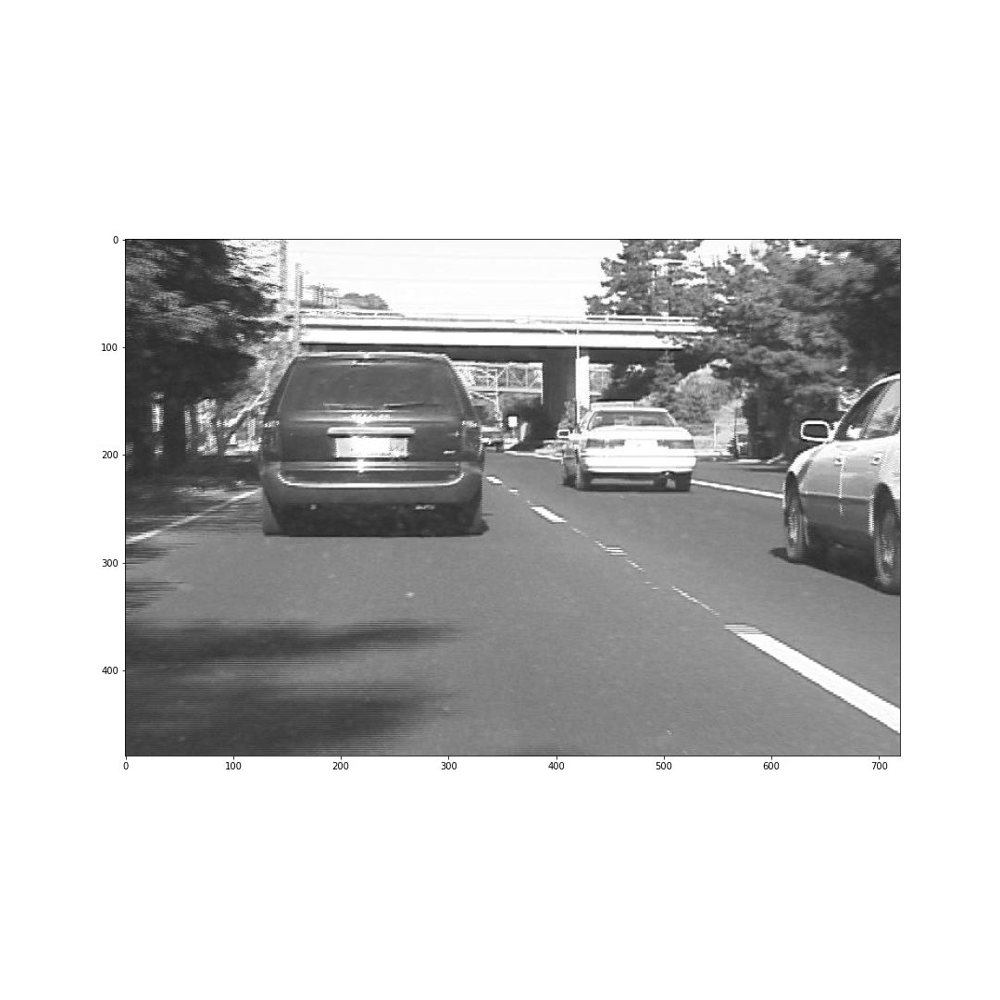

113 97
339 275


In [ ]:
%matplotlib ipympl
path = '/content/drive/MyDrive/Assignment-3 part2/assignment 3- data/car1.npy'
car1=parse_video(path)
fframe = next(car1)
coord,x_range,y_range=[],[],[]
selectpt(fframe)

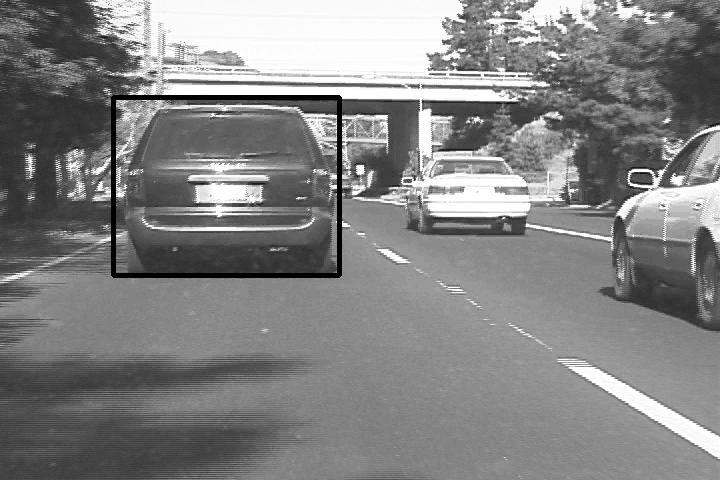

In [ ]:
visualizer(coord,fframe)

0it [00:00, ?it/s]

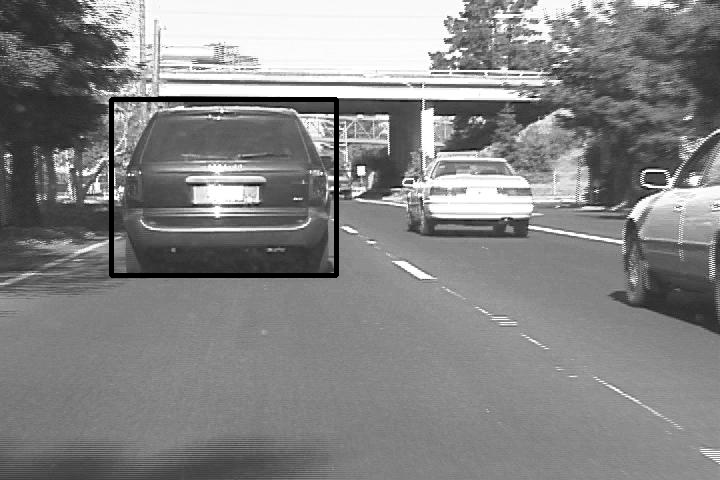

50it [00:07,  5.66it/s]

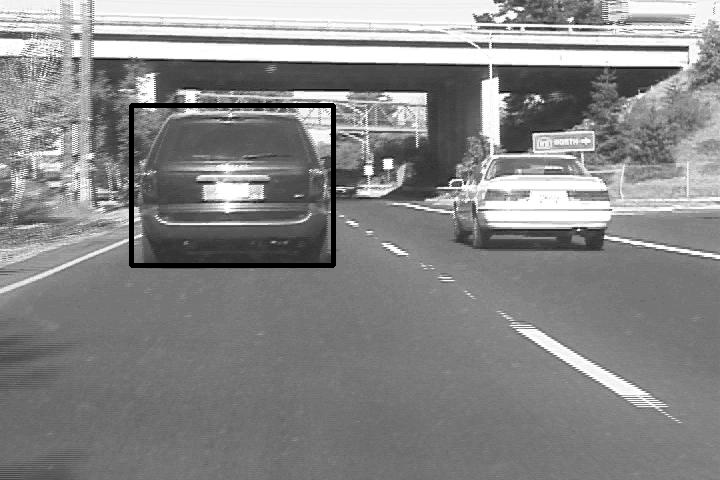

99it [00:14,  7.98it/s]

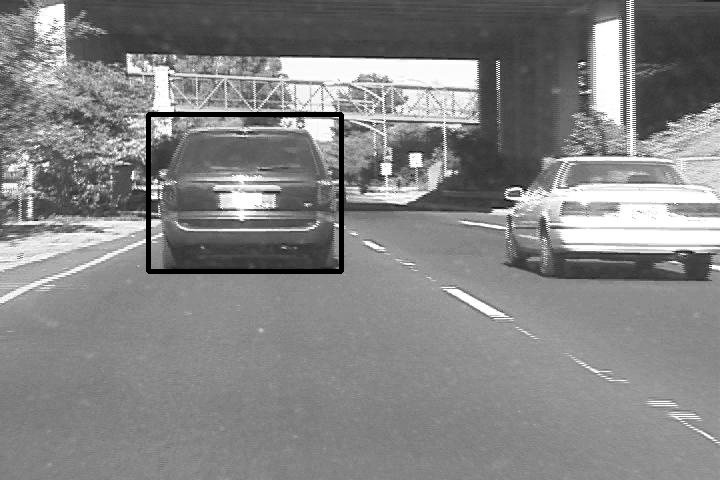

150it [00:29,  3.42it/s]

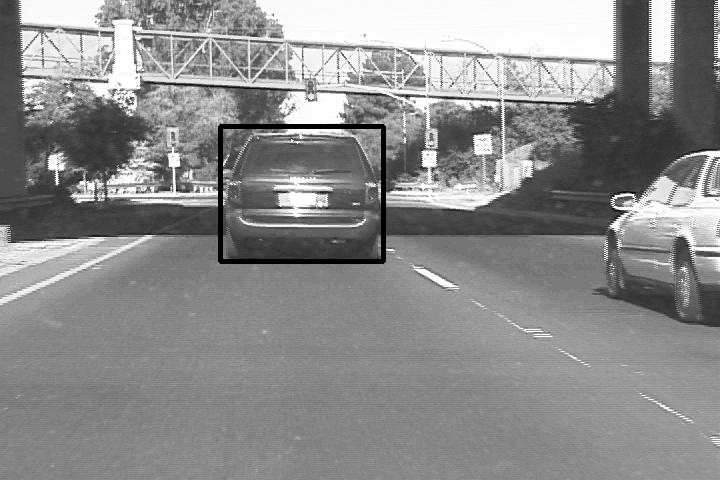

200it [00:47,  1.39it/s]

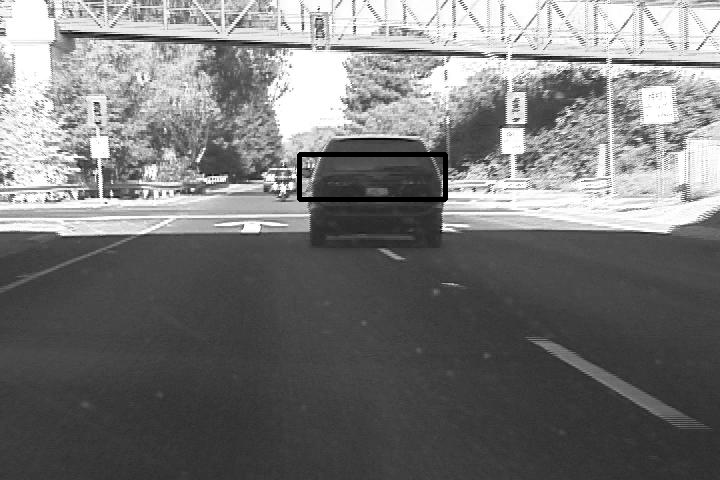

250it [01:08,  2.31it/s]

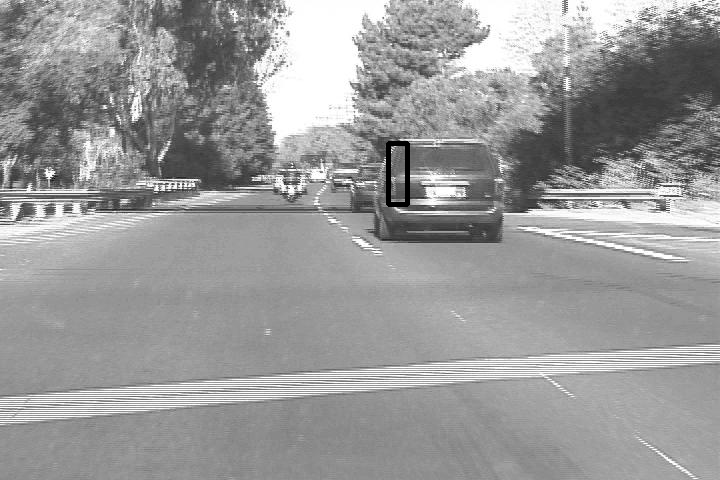

257it [01:13,  3.51it/s]


In [ ]:
T_x_array = get_T_x_array(fframe,x_range,y_range)
t_x_mean=np.mean(fframe)
T_x_coordinates=get_coordinates_array(x_range,y_range)
p=np.array([[0,0,0,0,0,0]]).T
threshold=0.03
car1_p='car1out'
# os.mkdir(car1_p)
for count,frame in tqdm(enumerate(car1)):
    gray=np.copy(frame)
    i_x_mean=np.mean(gray)
    gray=(gray*((t_x_mean/i_x_mean))).astype(float)
    sobelx,sobely = sobel(gray)
    
    while True:
        p, del_p, p_norm,new_img_coordinates,new_vertex,sane= affineLKtracker(T_x_coordinates,T_x_array,gray,x_range,y_range,p,sobelx,sobely)     
        if p_norm <= threshold or sane == False :
            break
    new_vertex=np.delete(new_vertex, 1, axis=1)
    new_vertex=np.delete(new_vertex, -1, axis=1)
    new_vertex=np.int32([new_vertex.T])
    new_vertex=[tuple(x) for x in new_vertex[0]]
    rect_img = visualizer(new_vertex,frame,viz=False)
    if count%50==0:
       visualizer(new_vertex,frame)
    cv.imwrite(os.path.join(car1_p,f'{count}.png'), rect_img)

### Car 2 video


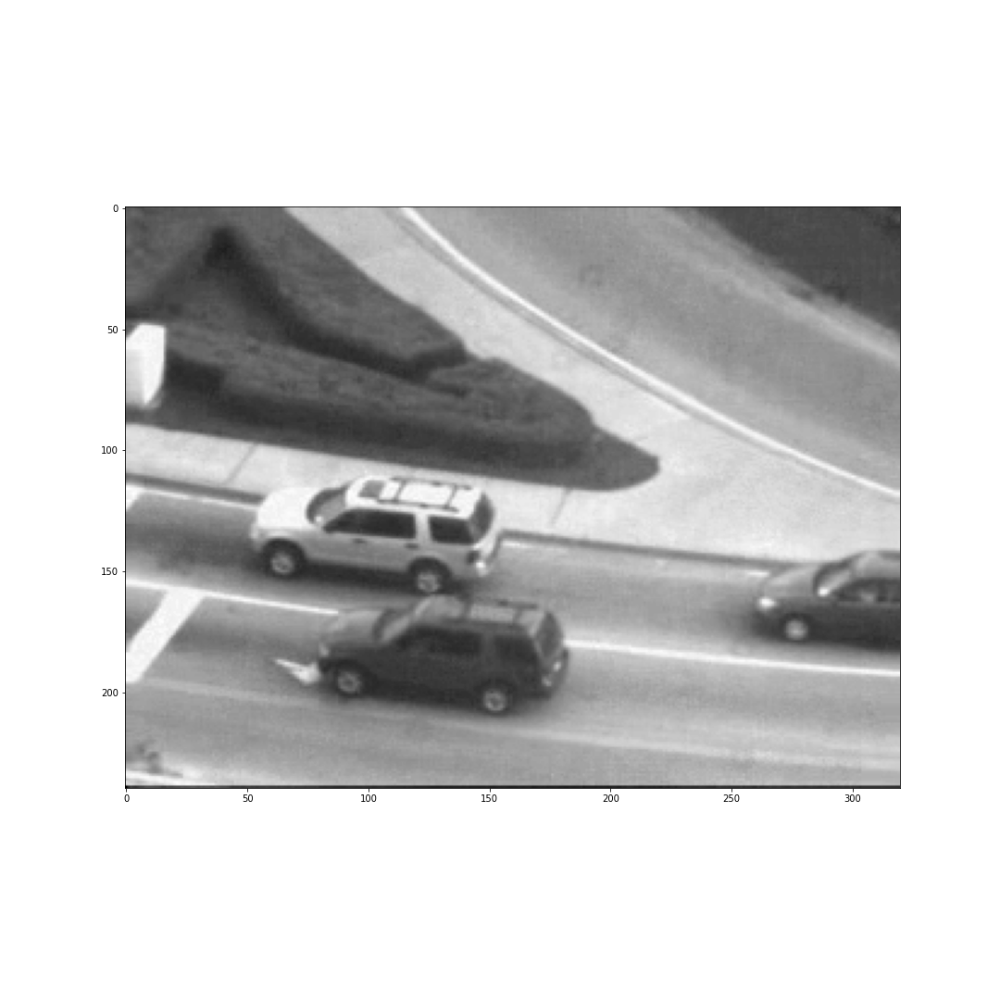

40 97
163 167


In [ ]:
%matplotlib ipympl
path = '/content/drive/MyDrive/Assignment-3 part2/assignment 3- data/car2.npy'
car2=parse_video(path)
fframe = next(car2)
coord,x_range,y_range=[],[],[]
selectpt(fframe)

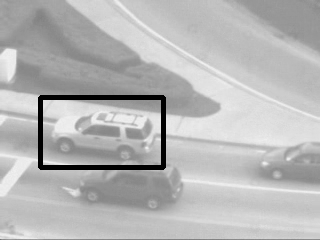

In [ ]:
fframe=cv.cvtColor(fframe,cv.COLOR_GRAY2RGB)
fframe=cv.cvtColor(fframe,cv.COLOR_RGB2GRAY)
visualizer(coord,fframe)

0it [00:00, ?it/s]

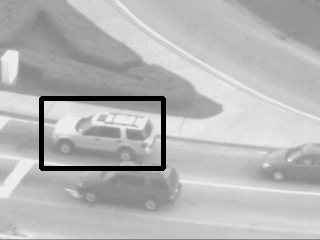

49it [00:02, 19.87it/s]

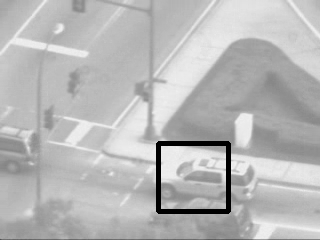

92it [00:03, 63.49it/s]

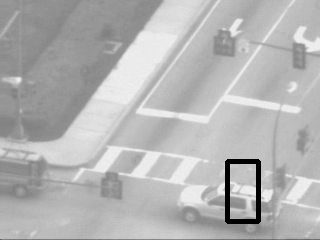

144it [00:04, 153.78it/s]

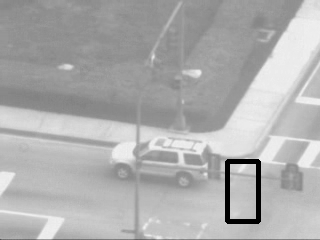

200it [00:04, 215.70it/s]

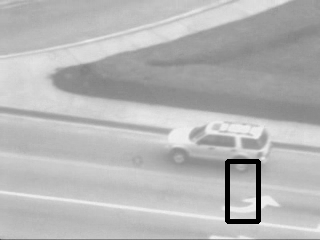

224it [00:04, 220.95it/s]

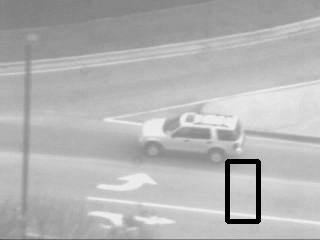

281it [00:04, 246.90it/s]

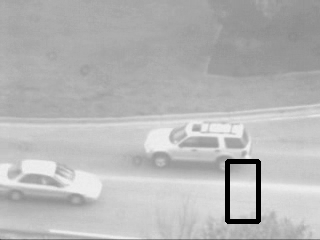

338it [00:04, 262.88it/s]

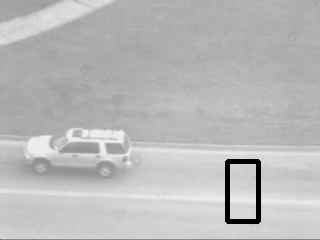

398it [00:04, 273.98it/s]

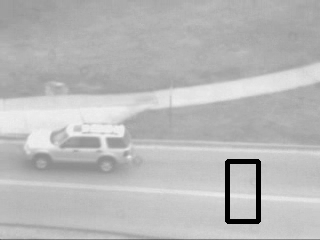

414it [00:05, 82.26it/s] 


In [ ]:
T_x_array = get_T_x_array(fframe,x_range,y_range)
t_x_mean=np.mean(fframe)
T_x_coordinates=get_coordinates_array(x_range,y_range)
p=np.array([[0,0,0,0,0,0]]).T
threshold=0.03
car2_p='car2out'
os.mkdir(car2_p)
for count,frame in tqdm(enumerate(car2)):
    frame=cv.cvtColor(frame,cv.COLOR_GRAY2RGB)
    frame=cv.cvtColor(frame,cv.COLOR_RGB2GRAY)
    gray=np.copy(frame)
    i_x_mean=np.mean(gray)
    gray=(gray*((t_x_mean/i_x_mean))).astype(float)
    sobelx,sobely = sobel(gray)
    c=0
    while True:
        p, del_p, p_norm,new_img_coordinates,new_vertex,sane= affineLKtracker(T_x_coordinates,T_x_array,gray,x_range,y_range,p,sobelx,sobely)     
        if p_norm <= threshold or sane == False or c>50 :
            break
        c+=1
    new_vertex=np.delete(new_vertex, 1, axis=1)
    new_vertex=np.delete(new_vertex, -1, axis=1)
    new_vertex=np.int32([new_vertex.T])
    new_vertex=[tuple(x) for x in new_vertex[0]]
    rect_img = visualizer(new_vertex,frame,viz=False)
    if count%50==0:
       visualizer(new_vertex,frame)
    cv.imwrite(os.path.join(car2_p,f'{count}.png'), rect_img)

###Landing

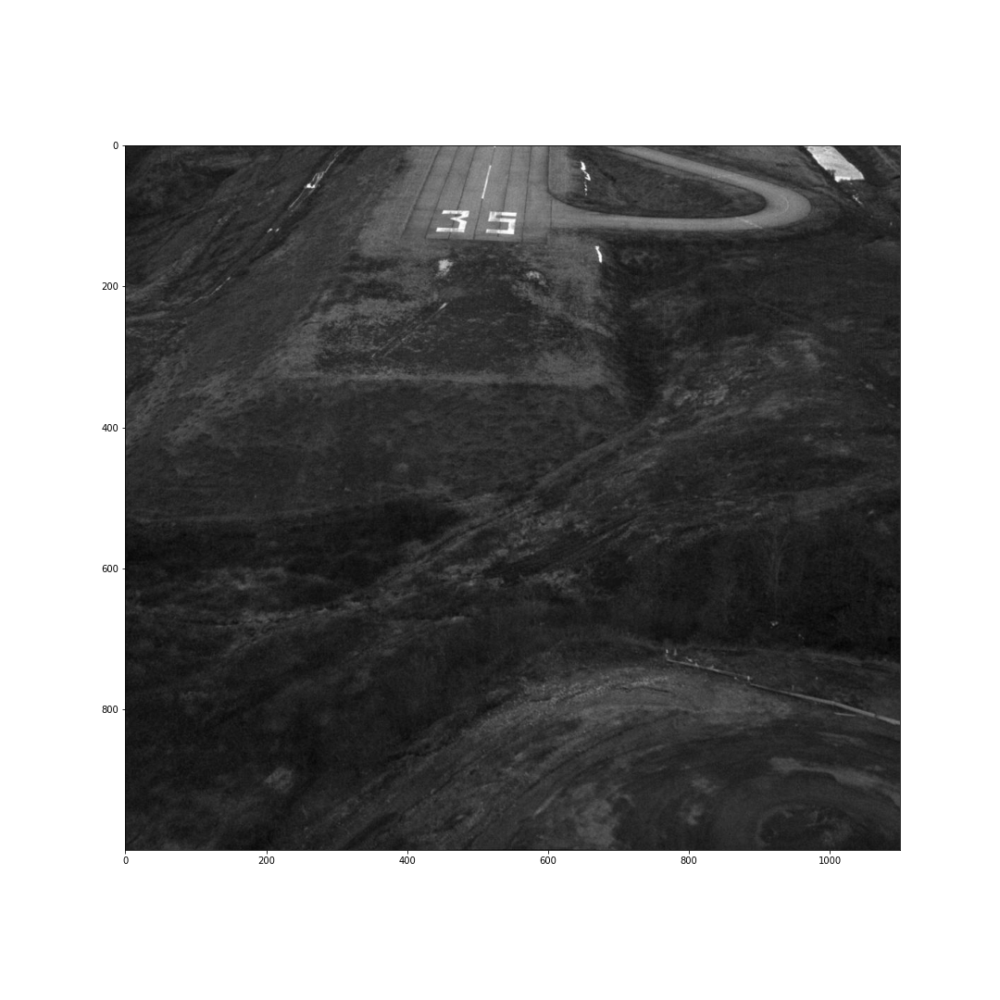

414 85
572 128


In [ ]:
%matplotlib ipympl
path = '/content/drive/MyDrive/Assignment-3 part2/assignment 3- data/landing.npy'
landing=parse_video(path)
fframe = next(landing)
coord,x_range,y_range=[],[],[]
selectpt(fframe)

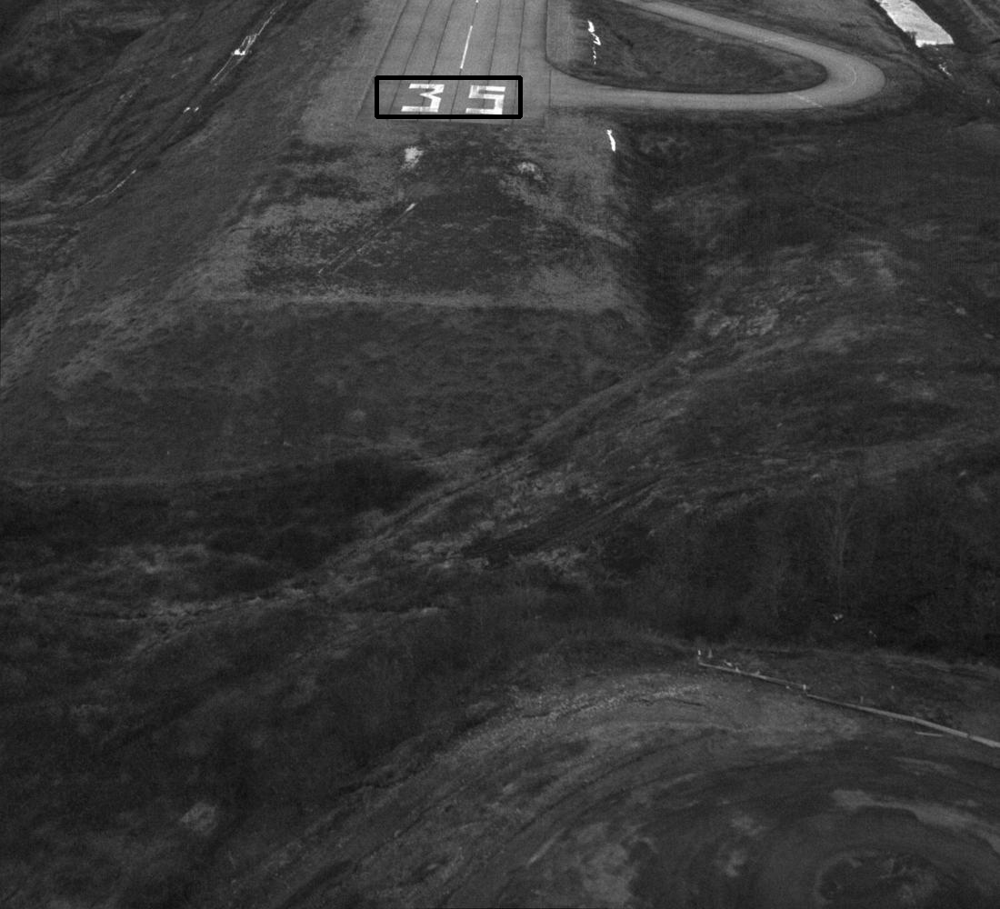

In [ ]:
visualizer(coord,fframe)

0it [00:00, ?it/s]

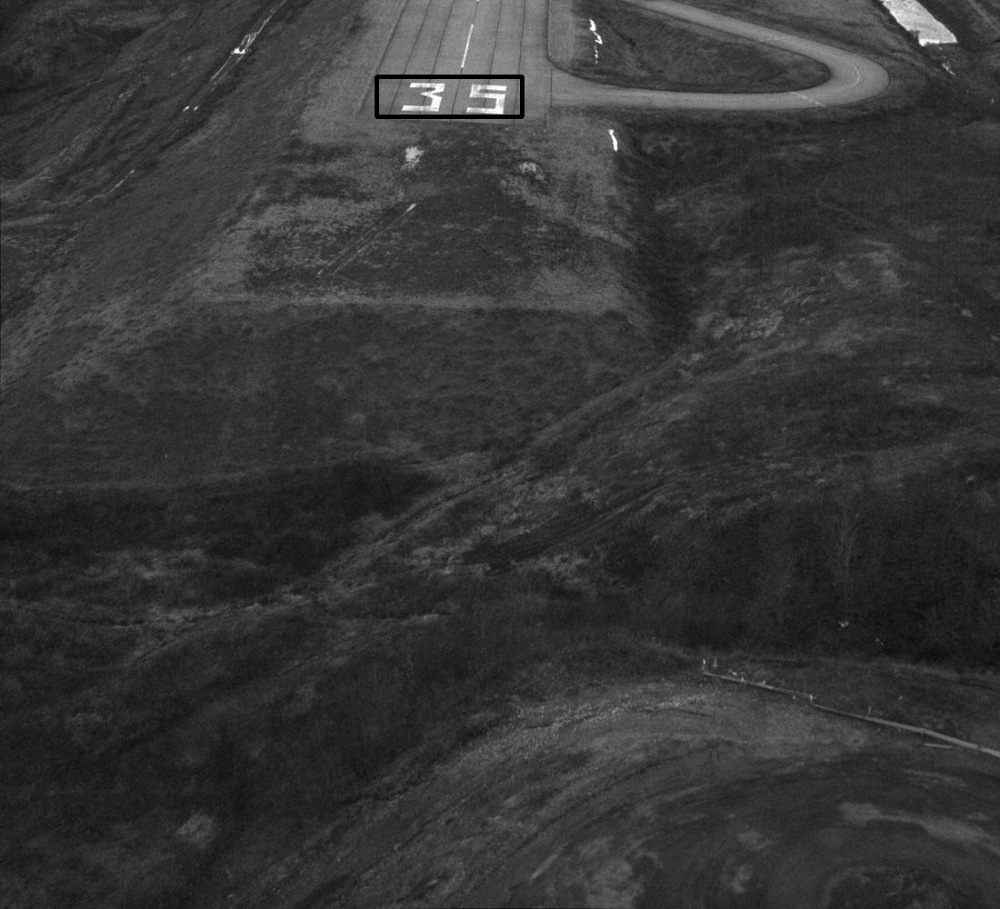

10it [00:04,  3.72it/s]

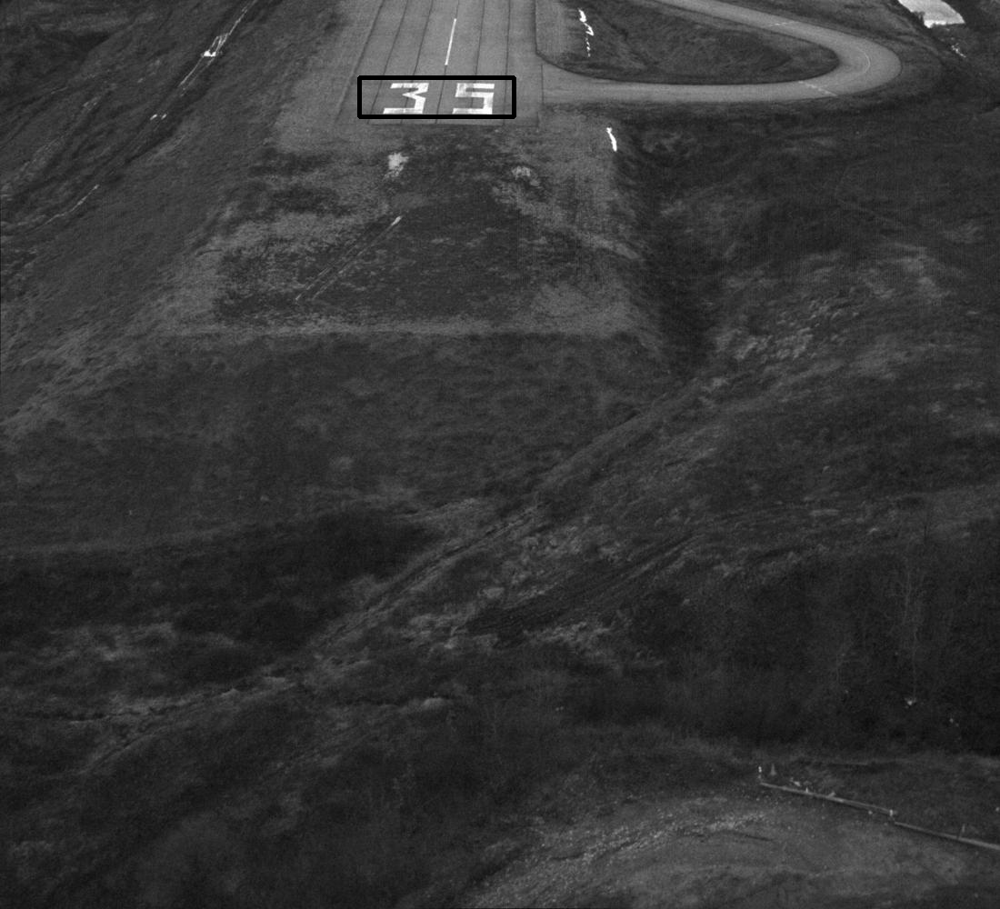

20it [00:06,  8.93it/s]

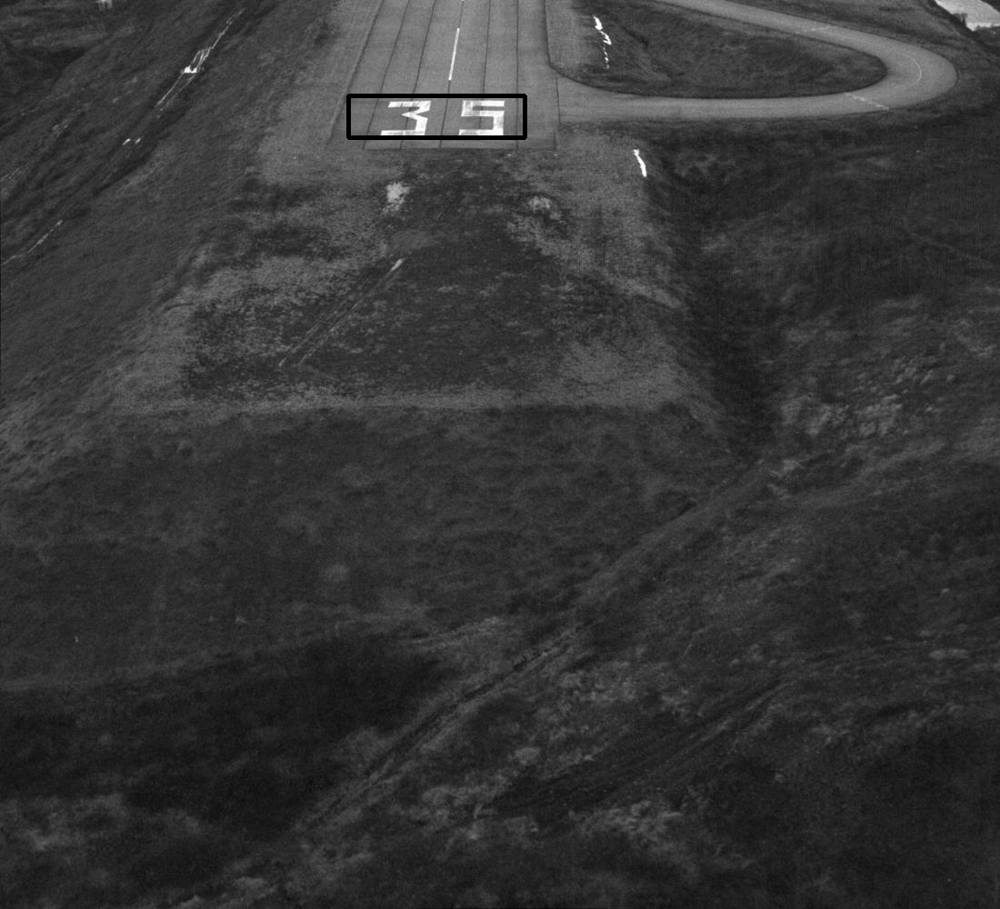

29it [00:07,  6.52it/s]

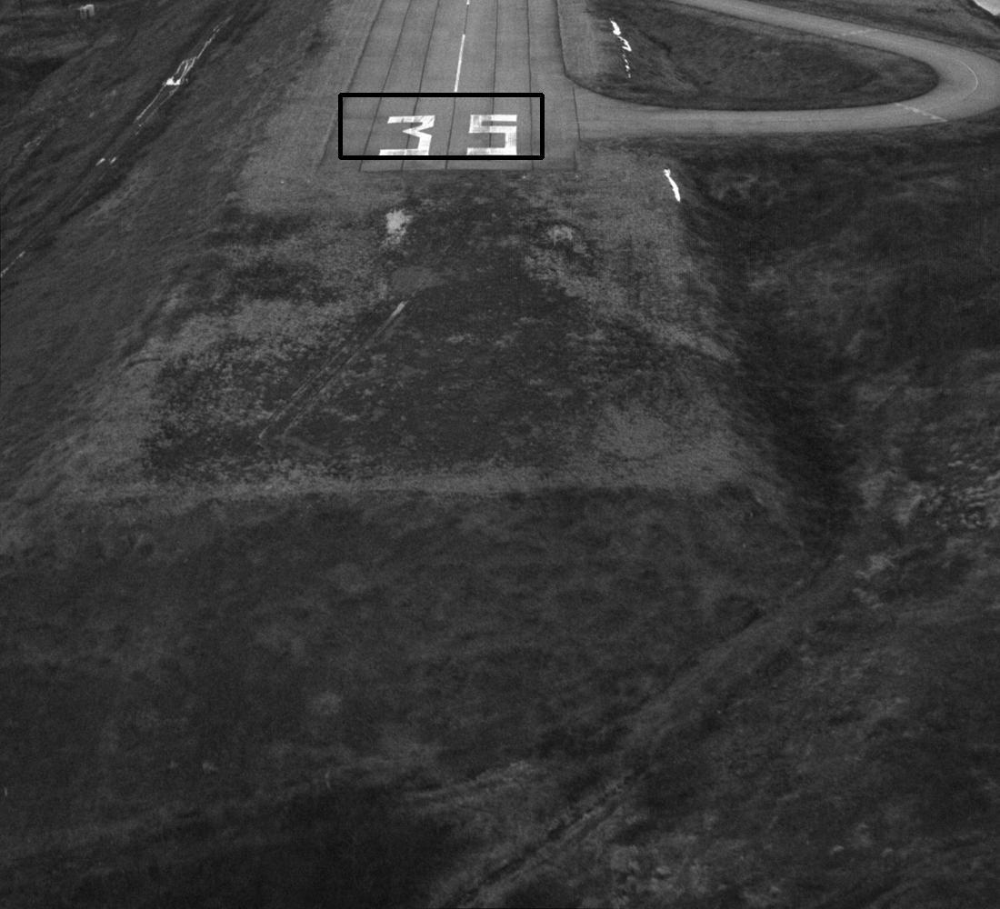

40it [00:10,  3.65it/s]

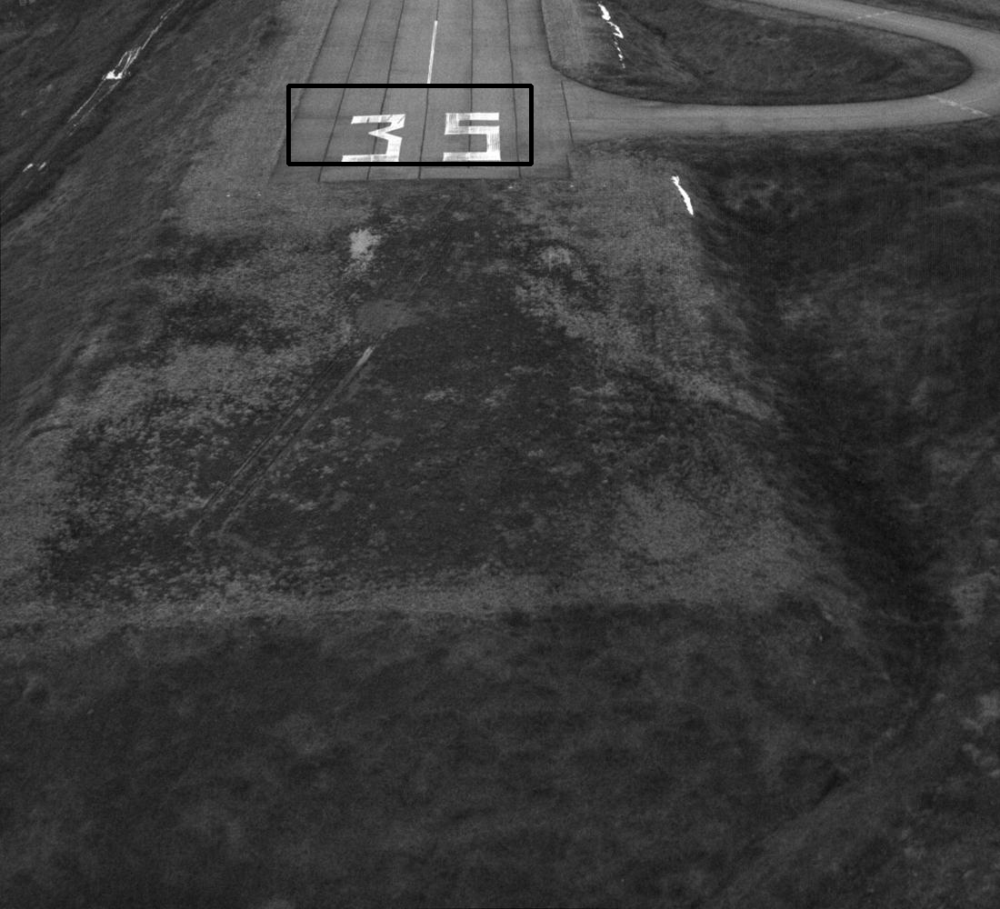

49it [00:14,  3.42it/s]


In [ ]:
T_x_array = get_T_x_array(fframe,x_range,y_range)
t_x_mean=np.mean(fframe)
T_x_coordinates=get_coordinates_array(x_range,y_range)
p=np.array([[0,0,0,0,0,0]]).T
threshold=0.03
landing_p='landingout'
os.mkdir(landing_p)
for count,frame in tqdm(enumerate(landing)):
    gray=np.copy(frame)
    i_x_mean=np.mean(gray)
    gray=(gray*((t_x_mean/i_x_mean))).astype(float)
    sobelx,sobely = sobel(gray)
    
    while True:
        p, del_p, p_norm,new_img_coordinates,new_vertex,sane= affineLKtracker(T_x_coordinates,T_x_array,gray,x_range,y_range,p,sobelx,sobely)     
        if p_norm <= threshold or sane == False :
            break
    new_vertex=np.delete(new_vertex, 1, axis=1)
    new_vertex=np.delete(new_vertex, -1, axis=1)
    new_vertex=np.int32([new_vertex.T])
    new_vertex=[tuple(x) for x in new_vertex[0]]
    rect_img = visualizer(new_vertex,frame,viz=False)
    if count%10==0:
       visualizer(new_vertex,frame)
    cv.imwrite(os.path.join(landing_p,f'{count}.png'), rect_img)

### create video

In [ ]:
image_dir = '/content/car2out'
images = [f for f in os.listdir(image_dir) if f.endswith('.png')]
images.sort()
fps = 30.0
img = cv.imread(os.path.join(image_dir, images[0]))
height, width, layers = img.shape
fourcc = cv.VideoWriter_fourcc(*'mp4v')
video = cv.VideoWriter('car2out.mp4', fourcc, fps, (width, height))
for image in images:
    img = cv.imread(os.path.join(image_dir, image))
    video.write(img)
video.release()